# CS5489 - Machine Learning
# Lecture 7b - Deep Learning
### Dept. of Computer Science, City University of Hong Kong

# Outline
- Going deeper
  - ReLU and Batchnorm
- Optimization methods
- **Deep architectures and Image classification**
- Transfer learning

In [1]:
# setup
%matplotlib inline
import matplotlib_inline   # setup output image format
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 100  # display larger images
import matplotlib
from numpy import *
import numpy as np
from sklearn import *
from scipy import stats
from scipy import signal
import random
import math
from prettytable import PrettyTable

rbow = plt.get_cmap('rainbow')

In [2]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
from torchvision.transforms import ToTensor
from torchvision.transforms import functional as F
import struct
import sys
print(f"Python: {sys.version} PyTorch: {torch.__version__}")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Python: 3.13.5 | packaged by Anaconda, Inc. | (main, Jun 12 2025, 16:09:02) [GCC 11.2.0] PyTorch: 2.8.0+cu129
Using device: cuda


In [3]:
def plot_history(history): 
    fig, ax1 = plt.subplots()
    
    ax1.plot(history['train_loss'], 'r', label="training loss ({:.6f})".format(history['train_loss'][-1]))
    ax1.plot(history['val_loss'], 'r--', label="validation loss ({:.6f})".format(history['val_loss'][-1]))
    ax1.grid(True)
    ax1.set_xlabel('iteration')
    ax1.legend(loc="best", fontsize=9)    
    ax1.set_ylabel('loss', color='r')
    ax1.tick_params('y', colors='r')

    if 'train_accuracy' in history:
        ax2 = ax1.twinx()

        ax2.plot(history['train_accuracy'], 'b', label="training acc ({:.4f})".format(history['train_accuracy'][-1]))
        ax2.plot(history['val_accuracy'], 'b--', label="validation acc ({:.4f})".format(history['val_accuracy'][-1]))

        ax2.legend(loc="best", fontsize=9)
        ax2.set_ylabel('acc', color='b')        
        ax2.tick_params('y', colors='b')
    plt.show() 

In [4]:
def show_imgs(W_list, nc=10, highlight_green=None, highlight_red=None, titles=None):
    nfilter = len(W_list)
    nr = (nfilter - 1) // nc + 1
    for i in range(nr):
        for j in range(nc):
            idx = i * nc + j
            if idx == nfilter:
                break
            plt.subplot(nr, nc, idx + 1)
            cur_W = W_list[idx]
            if ndim(cur_W) == 2:
                plt.imshow(cur_W,cmap='gray', interpolation='nearest')  
            else:
                plt.imshow(cur_W,interpolation='nearest')  
                
            if titles is not None:
                if isinstance(titles, str):
                    plt.title(titles % idx)
                elif isinstance(titles, list):
                    plt.title(titles[idx])
                else:
                    plt.title(titles)
            
            if ((highlight_green is not None) and highlight_green[idx]) or \
               ((highlight_red is not None) and highlight_red[idx]): 
                ax = plt.gca()
                if highlight_green[idx]:
                    mycol = '#00FF00'
                else:
                    mycol = 'r'
                for S in ['bottom', 'top', 'right', 'left']:
                    ax.spines[S].set_color(mycol)
                    ax.spines[S].set_lw(2.0)
                ax.xaxis.set_ticks_position('none')               
                ax.yaxis.set_ticks_position('none')
                ax.set_xticks([])
                ax.set_yticks([])
            else:
                plt.gca().set_axis_off()
    plt.show()

# Image Classification
- **Goal:** given an image, predict the object class
  - typically only one main object is present
  - If enough classes are considered, then it's a generic high-level vision task
  
<center><img src='imgs/imagenet-objects.jpg' width=500></center>

# ImageNet
- ImageNet Large Scale Visual Recognition Challenge (ILSVRC)
  - 1000 image classes
  - 1.2 million images
  - Human performance: ~5.1% (top-5 classification error)

<center><img src='imgs/imagenet-collage.png'></center>

# Performance of Deep Learning
- The introduction of ILSVRC coincided with the emergence of Deep Learning.
- Top-5 error rate decreased as deeper NN were developed
  - Not just deeper, but also the architecture design was smarter
  
<center><img src='imgs/imagenet-methods.png' width=600></center>

# LeNet-5 (1998)

- The standard CNN architecture
  - 7 layers
  - convolutions & pooling, final fully-connected layer
- Designed for hand-written digit recongition (MNIST)

<center><img src="imgs/LeNet.png" width=800></center>

# AlexNet
- Similar architecture to LeNet, but deeper (14 layers)
  - 11x11, 5x5, 3x3 convolutions
- Tricks used: DropOut, ReLU, max pooling, data augmentation, SGD momentum
- One of the first networks trained on GPU
  - (it is split in two pipelines because it was trained on 2 GPUs simultaneously)

<center><img src="imgs/AlexNet.png"></center>

# VGGnet
- Same style as LeNet and AlexNet
- Design choices:
  - only use 3x3 convolution filters (less parameters)
  - stack several convolution layers one after another, followed by pooling
    - equivalent to using a larger filter, but with less parameters.
  - number of feature channels doubles after each stage.
    - more higher-level features
    

<center><img src="imgs/VGG16.png"></center>

# Progress so far...
- Deeper...more parameters...better accuracy...
  - *performance is saturating*
  
<center><img src="imgs/cnnperf.png" width=800></center>

# InceptionNet
- "Network-in-Network" architecture
  - Core building blocks (modules), consisting of several layers, are combined repeatedly.
- Inception Module
  - several convolution filters in parallel
    - extract features at different scales (1x1, 3x3, 5x5)
    - pool features (3x3 max)
  - features are concatenated and passed to next block.
<center><img src="imgs/Inception-Module.png" width=500></center>

# InceptionNet (V1)
- 9 inception modules, 22 layers
  - 50 convolution blocks
- Auxiliary classification tasks
  - using features in the middle of the network to perform classification (yellow boxes)
<center><img src="imgs/InceptionNet.png"></center>

# Auxiliary tasks
- **Goal:** strengthen the supervisory signal to the early layers
- perform the same classification task with branches off the main network.
- new loss is sum of individual classification losses:
  - $L = \lambda_0 L_0 + \lambda_1 L_1 + \lambda_2 L_2$
  - $\frac{dL}{d\mathbf{w}} = \lambda_0 \frac{dL_0}{d\mathbf{w}} + \lambda_1 \frac{dL_1}{d\mathbf{w}} + \lambda_2\frac{dL_2}{d\mathbf{w}}$


- auxiliary tasks shorten the path to compute the gradients of early layers.
  - more direct supervision to the earlier layers.
  - encourages earlier layers to be more discriminative.
<center><img src="imgs/InceptionNetgd.png"></center>

# Multi-task learning
- several related tasks are learned together using a shared base network.
<center><img src="imgs/multitask.png" width=600></center>

- combined loss: $L = \lambda_0 L_0 + \lambda_1 L_1 + \lambda_2 L_2$


- multiple supervisory signals make the common network find good features for all tasks.
  - gradients are accumulated in the common base network.

<center><img src="imgs/multitaskg.png" width=600></center>

- if the tasks are related, the features for one task could be useful for the other tasks.
  - e.g., facial landmark locations could help face recognition.





# Going deeper
- **Idea:** when stacking more layers, we should not have degraded performance, since we could make the new layer as an "identity" layer.
  - if $\mathbf{A} = \mathbf{I}$, then $f_i(\mathbf{x}) = \mathbf{A}^T\mathbf{x} = \mathbf{x}$
  - i.e., this layer doesn't change the hidden values from the previous layer.
- **Problem:** if we use L2 regularization on $\mathbf{A}$, then we encourage $\mathbf{A}\rightarrow 0$.
  - so we cannot get this behavior...

# Residual Learning
- **Solution**: learn a residual function so that if $\mathbf{A}=0$, then $f(\mathbf{x})=\mathbf{x}$
  - residual function ${\cal F}(\mathbf{x}) = \mathbf{A}^T\mathbf{x}$
  - output: $f(\mathbf{x}) = {\cal F}(\mathbf{x}) + \mathbf{x}$
    - learn the $\mathbf{A}$ in the residual.
    - when $\mathbf{A}=0$, then $f(\mathbf{x}) = \mathbf{x}$.
  - the "identity path" is sometimes called a "shortcut" connection.
<center><img src="imgs/ResNet-Block.png" width=300></center>

# Residual Blocks
- Different versions of the blocks.
  - differences in where to add the identity
  - (e) is preferred.
<center><img src="imgs/resnetblocks.png" width=600></center>

# Stacking Residual Blocks
- The network is learning a function (image to class)
  - build the function by appending residual blocks
  - each block learns a residual, which is added to the previous block
    - keep all the previous information and make small changes with the residual

# Residual Network (ResNet)
- 34 layers, 50 layers, 100 layers, 1000 layers
  - 3x3 filters
  - residual connection every two layers.
<center><img src="imgs/ResNet-full.png"></center>

# ResNet as an Ensemble
- Consider a 3-block ResNet

<center><img src="imgs/resnet3.png" width=350></center>

- Look at the equations:
$$\begin{aligned}
\mathbf{z}_1 &= \mathbf{x} + f_1(\mathbf{x}),\\
\mathbf{z}_2 &= \mathbf{z}_1 + f_2(\mathbf{z}_1),\\
\mathbf{z}_3 &= \mathbf{z}_2 + f_3(\mathbf{z}_2)
\end{aligned}$$

- Substitute for $\mathbf{z}_2$...
  $$\mathbf{z}_3 =  \color{blue}{\underbrace{\mathbf{z}_1 + f_2(\mathbf{z}_1)}} + f_3( \color{blue}{\underbrace{\mathbf{z}_1 + f_2(\mathbf{z}_1)}})$$
- Substitute for $\mathbf{z}_1$...
  $$\mathbf{z}_3 =  \color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}} + f_2(\color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}}) + f_3( \color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}} + f_2(\color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}}))$$


- the output is sum of different combinations of residual blocks
  $$\mathbf{z}_3 =  \color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}} + \color{orange}{\underbrace{f_2(\color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}})}} + \color{blue}{\underbrace{f_3( \color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}} + \color{orange}{\underbrace{f_2(\color{red}{\underbrace{\mathbf{x} + f_1(\mathbf{x})}})}})}}$$
  - equivalent to an *ensemble*!
<center><img src="imgs/resnet3unravel2.png" width=350></center>




- *How many paths are there?*
  - can select block $f_i$ or not, thus $2^N$ paths.
     - where $N$ is the number of residual blocks.
  - $2^N$ models in the ensemble

# Robustness
- Because it is an ensemble, ResNet is robust  to removal of a few blocks (sub-models).
  - error is still small when a few blocks are removed.
<center><img src="imgs/resnetremoval.png" width=400></center>
  - can be exploited to make prunable NN by ordering the blocks according to their importance.

# Paths and Gradients
- (a) the paths through the ResNet has different lengths
  - number of paths with length $L$ = "$N$ choose $L$", $N$ = number of blocks.
- (b) shorter paths have more effective gradients because they have direct supervision from the loss.
  - reduces the vanishing gradient problem.
- (c) although there are many paths, the short paths contain most of the gradient signal.
  - effectively, the network is shallow during training.
<center><img src="imgs/resnetgradient.png" width=600></center>

# DenseNet
- Each layer gets inputs from all previous layers
  - Since features maps are passed forward, fewer output channels are required in each layer.
  - last layer uses all previous feature maps (of various semantic levels).
<center><img src="imgs/DenseNet.png" width=600></center>

# Attention Mechanisms
- ignore unimportant features (channels or spatial regions) in the feature map by using a (soft) mask.
 - i.e., attend to only important features (or spatial regions)
- "Squeeze-Excitation Block"
  - "squeeze" feature map into 1x1 channel vector
  - "excite" features by scaling up important ones, and scaling down less-important ones.
  
<center><img src="imgs/senetblock.png" width=600></center>

# SEnet
- the SE block can be incorporated into standard architectures.
<center><img src="imgs/senet.png"></center>

# Error vs. Computation vs. Number of Parameters

- Just adding more layers is limited.
  - Too many parameters
- More improvement by changing the architecture design.
  - Smarter use of the parameters
  - **Architecture Design is important!**

<center><table><tr><td><img src="imgs/compare-cnn1.png" width=400></td><td><img src="imgs/compare-cnn2.png" width=400></td></tr></table></center>

# Moving forwards
- Performance with CNN-style architectures seems to be saturated. 
- **Advantage:**
  - inductive bias (assumptions) of CNNs: translation equivariance, locality
- **Disadvantages:**
  - cannot well model long-range dependencies (global context)
    - in the receptive field, 2 far-apart pixels are connected via a long path.
  - low speed - adding more layers cannot be parallelized.
- **Solution:** need a new type of architecture.

# Transformers
- NLP sequence-to-sequence model (e.g. machine translation)
  - remove previous inductive biases: no recurrences, no convolutions
  - processes all words (inputs) in parallel
  - selectively attend to different locations with a _self-attention_ mechanism
  
  <center><img src="imgs/transformer2.png" width=400></center>

# Encoder
- Stack of 6 blocks with identical architecture
  - input & output: sequence of word tokens
  - multi-head self-attention (MHA): find correlated features
  - residual connection: MHA updates the current features
  - layer normalization: normalize all features within layer to ${\cal N}(0,1)$
  - position-wise feed-forward NN (MLP): identical for each position.
  - Input tokens $X \in \mathbb{R}^{D\times n}$ for a batch of $n$ tokens.
  
<center><img src="imgs/enc.png" width=200></center>

# Dot-Product Attention

- Attention mechanism has 3 parts:
  - $n$ is the number of input words (positions).
  - query $\mathbf{Q}=W^{Q}X=[\mathbf{q}_1 \cdots \mathbf{q}_n] \in \mathbb{R}^{d_k \times n}$: what we want to match.
  - key $\mathbf{K}=W^{K}X=[\mathbf{k}_1 \cdots \mathbf{k}_n] \in \mathbb{R}^{d_k \times n}$: what we match against.
  - value $\mathbf{V}=W^{V}X=[\mathbf{v}_1 \cdots \mathbf{v}_n] \in \mathbb{R}^{d_v \times n}$: what to output when there is a match.
  - $W^{Q},W^{K} \in \mathbb{R}^{d_k\times D}, \ W^{V} \in \mathbb{R}^{d_v\times D}$, where $d_k, d_v$ are the dimensions of the key-query space and value space and $D$ is the embedding (model) dimension ($D=12288$ for GPT-3).
<center><img src="imgs/attention.png" width=200></center>

- Attention matrix:
  - $\mathbf{A} =  [\mathbf{a}_{1} \cdots \mathbf{a}_n] = \mathrm{softmax}(\frac{1}{\sqrt{d_k}}\mathbf{K}^T\mathbf{Q}) \in \mathbb{R}^{n \times n}$
    - $\mathbf{a}_j=\mathrm{softmax}(\frac{1}{\sqrt{d_k}}\mathbf{K}^T\mathbf{q}_j)$ is the vector of matches for the j-th query (to all keys).
    - $A_{ij}$ is the match between the j-th query and the i-th key.
<center><img src="imgs/attention.png" width=200></center>

- Output: $\mathrm{Attn}(\mathbf{Q}, \mathbf{K}, \mathbf{V}) = \mathbf{V}\mathbf{A} = [\mathbf{V}\mathbf{a}_{1} \cdots \mathbf{V}\mathbf{a}_n]$
  - for the j-th query, linear combination of values for matched keys.

<center><img src="imgs/attention.png" width=200></center>

# Multi-Head Attention
- Input: $X \in \mathbb{R}^{D \times n}$
- Perform multiple dot-product attentions in parallel
- Each _head_ projects the input $X$ to its own lower-dim key/query/value space that is learned
  - head weights: $\mathbf{W}_i^Q,\mathbf{W}_i^K \in \mathbb{R}^{d_k \times D}, \mathbf{W}_i^V\in \mathbb{R}^{d_v \times D}$
  - head QKV: $\mathbf{Q}'=\mathbf{W}_i^Q X, \mathbf{K}'=\mathbf{W}_i^K X, \mathbf{V}'=\mathbf{W}_i^V X$
  - head output: $\mathbf{H}_i = \mathrm{Attn}(\mathbf{Q}', \mathbf{K}',\mathbf{V}')$

<center><img src="imgs/MHA.png" width=250></center>

- Output: concatenate head outputs and project to original space
  - $\mathrm{MHA}(\mathbf{Q},\mathbf{K},\mathbf{V}) = \mathbf{W}^O \begin{bmatrix}\mathbf{H}_1 \\ \vdots \\\mathbf{H}_h\end{bmatrix}$
  - $\mathbf{W}^O \in \mathbb{R}^{D \times hd_v}$
  - We set the output dim of $\mathbf{W}^O$ to be $D$ since we hope to recover the original embedding dimension.
  - This means that after concatenation $d_v h = D$.
- Example dimensions:
  - number of heads $h=8$, embedding dimension $D=512$
  - $d_k = d_v = D/h = 64$
  
<center><img src="imgs/MHA.png" width=250></center>

# Other things
- position-wise NN (2-layer MLP) applies to each token position at end of each block.
  - weights shared for all token positions; different for each layer.
- learnable input embeddings: turn each word (token) into a vector.
  - $\mathbf{x}' = \mathbf{A}\mathbf{x}$
    - $\mathbf{x}$ is a one-hot encoding of the word.
    - $\mathbf{A}$ is a matrix of embedding vectors.
    
  <center><img src="imgs/transformer2.png" width=400></center>

- position-encoding 
  - the relative positions between inputs is not built into the self-attention architecture (c.f., convolution layer)
  - add a position-embedding to each word vector at the input.
  - learnable or fixed (sine and cosine waves of different frequencies)

<center><img src="imgs/posemb.png" width=600></center>

## Decoder
  - adds mask to MHA to predict the current word only using previous words.
  - apply MHA on output of the encoder.
  
<center><img src="imgs/encdec2.png" width=450></center>

# Vision Transformers (ViT)
- Apply transformer architecture to image classification
  1. Split image into patches (16x16 pixels).
  2. Flatten and then embed with linear projection.
  3. Prepend a learnable "[class]" token.
  
<center><img src="imgs/ViT.png" width=700></center>

- Apply transformer architecture to image classification
  4. Add position embeddings
  5. Apply transformer encoder
  6. Classification head: MLP on the first output of the encoder.
  
  <center><img src="imgs/ViT.png" width=700></center>

# Model variations
- Different variants with different depth.
- Can also apply ViT to the feature map from a CNN (Hybrid model)

<center><img src="imgs/ViTmodels.png" width=500></center>

# Model Pre-training & Results
- Pre-training on different datasets, test on ImageNet1k
  - worse than ResNets (BiT) when trained on IN1k (1k classes, 1.3M images)
  - similar when trained on IN21k (21k classes, 14M images)
  - better when trained on JFT (18k classes, 303M images)
  - **Why?**
  
<center><img src="imgs/ViTpretrain.png" width=500></center>

- **Reason:**
  - The inductive biases in ResNet helps on smaller datasets (IN1k), but ViT does not have enough data to learn this.
  - Large scale training on JFT, then ViT can outperform the inductive bias.

<center><img src="imgs/ViTpretrain2.png" width=500></center>

# Visualization & Intepretation
- Visualization of the models attention, linear embeddings, position encoding, and attention head

<center>
<table><tr>
    <td><img src="imgs/ViTattn.png" width=250></td>
    <td><img src="imgs/ViTstudy.png"></td></tr></table>
    </center>

# Error vs. Computation vs. Number of Parameters

- Transformer and self-attention mechanism
  - no clean theory (yet), overall observation is that more data + larger model = better generalization.
  - give rise to a series of empirical conjectures called "Scaling Laws".
  - A notable one is Chichilla scaling law (Hoffmann et al, 2022): $\mathcal{L}(N,T)=L_0+AT^{-\alpha}+BN^{-\beta}$, where $N,T$ are model size and data size respectively. Other constants can be learned to fit different LLMs.
  - Ideologically similar to "Moore's' Law", so this isn't a real law.

<center><table><tr><td><img src="imgs/compare-vit1.png" width=400></td><td><img src="imgs/compare-vit2.png" width=400></td></tr></table></center>

# Image Classifiers
- Keras includes several pre-trained image classifier networks
  - VGG16, VGG19, ResNet50, DenseNet, InceptionV3, ...
  - already trained on ImageNet
- Can use these networks to:
  - perform image classification (for 1000 classes only)
  - extract image features for our own task
  - transfer learning - modify/adapt a pre-trained network for our own task

- Import the ResNet model class and support functions
- Load and pre-process the image for the network

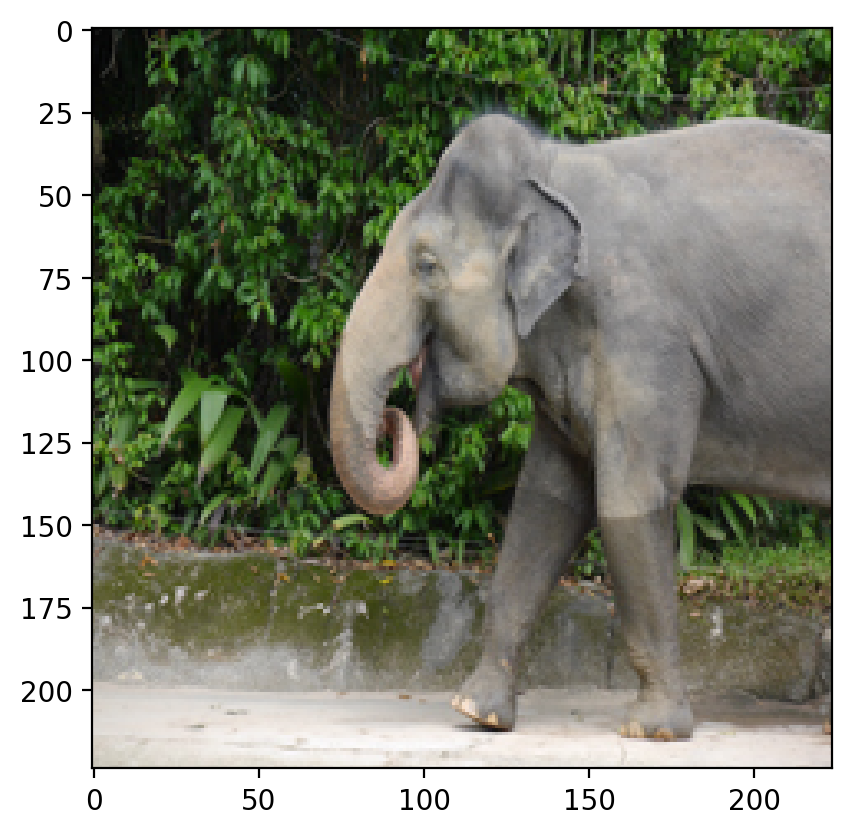

In [5]:
# contains the model and support functions for ResNet50
from PIL import Image
import torchvision.models as models

# load an image 
img_path = 'imgs/elephant1.jpg'
img = Image.open(img_path).convert('RGB').resize((224,224))  # ResNet expects this size
plt.imshow(np.asarray(img))
plt.show()

# create an instance of the model
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1) # you might use "model = models.resnet50(pretrained=True)" for older version   
model.eval()  # Set to evaluation mode

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

xi = preprocess(img)

- Create an instance of the ResNet50 model
  - trained on ImageNet
  - will download the model if loading for the first time.

- Look at the 1000 classes

In [6]:
from torchvision.models import ResNet50_Weights
# Get the class names (equivalent to decode_predictions)
weights = ResNet50_Weights.IMAGENET1K_V1
class_names = weights.meta["categories"]
print("All ImageNet classes:")
print(class_names)

All ImageNet classes:
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'rock python', 'Indian cobra', 'green mamba', 'sea snake', 'horned v

- Predict on the loaded image

In [7]:
# Make prediction
with torch.no_grad():
    predictions = model(torch.unsqueeze(xi, 0))
    
probability = torch.softmax(predictions,dim=-1)
values, indices = torch.topk(probability, k=3, dim=1)
top_classes = [class_names[idx] for idx in indices.squeeze()]

for v,c in zip(values.numpy().tolist()[0],top_classes):
    print((c,v))

('Indian elephant', 0.8288949131965637)
('tusker', 0.1690331995487213)
('African elephant', 0.0020219553261995316)


# Pre-trained Image Features
- The network is trained on ImageNet, which contains many classes and images.
- The learned features generalize well to other tasks
  - capture high-level discriminative information about objects

In [8]:
# load dessert dataset
import glob
import os

imglist = glob.glob(os.sep.join(['data','dessert', '*', '*.jpg']))
Xraw = []
Xim = []
Ylab = []
for i,img_path in enumerate(imglist):
    img = Image.open(img_path).convert('RGB').resize((224,224))
    Xraw.append(img)
    xi = preprocess(img)
    Xim.append(xi)
    Ylab.append(img_path.split(os.sep)[2])
Xim = torch.stack(Xim,dim=0)
print(Xim.shape)
print(len(Ylab))

torch.Size([200, 3, 224, 224])
200


In [9]:
# convert class strings into integers
print("class labels (strings):", unique(Ylab))
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Ylab)
print("Converted labels:")
print(Y)

class labels (strings): ['frozen_yogurt' 'ice_cream']
Converted labels:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


- Show a few examples of "ice cream" and "frozen yogurt"

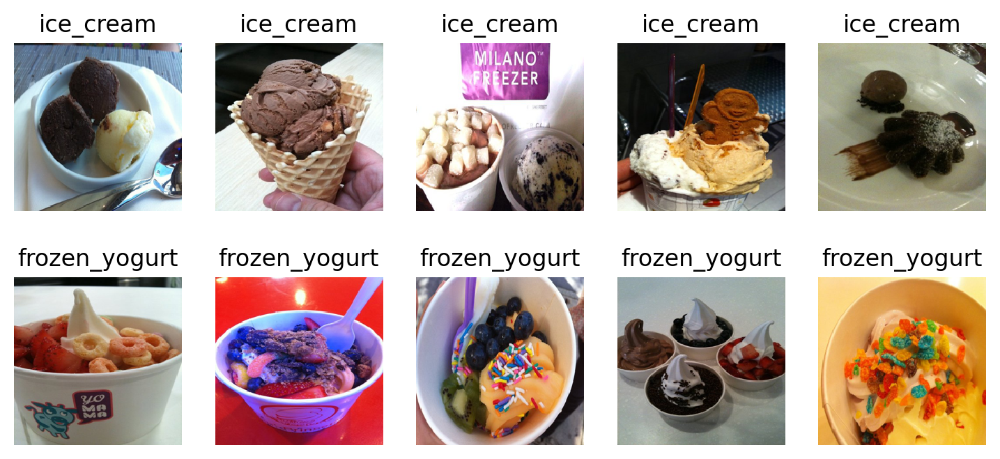

In [10]:
inds = [0, 1, 2, 3, 4, -1, -2, -3, -4, -5]
tmp = [Xraw[i] for i in inds]
t =  [Ylab[i] for i in inds]
plt.figure(figsize=(9,4))
show_imgs(tmp, nc=5, titles=t)

# Computing Image Features
- Use the pre-trained network as a feature extractor
  - remove the last layer (the classifier)
  - apply average pooling on the feature map
    - 7x7x2048 --> 1x2048

In [11]:
# create an instance of the model w/o the last layer
model_f = torch.nn.Sequential(*list(model.children())[:-1])  # Remove last layer
model_f = torch.nn.Sequential(
    model_f,
    torch.nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
    torch.nn.Flatten()  # Flatten to [batch_size, features]
)
model_f.eval()

print("Model structure:")
print(model_f)

# Compute features (equivalent to model_f.predict(Xim))
with torch.no_grad():
    Xf = model_f(Xim)  # Xim should be a PyTorch tensor [batch_size, 3, H, W]

print(f"Feature shape: {Xf.shape}")  # Should be [batch_size, 2048]

Model structure:
Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0

- Now use the features to train a binary classifier
- First setup the dataset

In [12]:
# randomly split data into train and test set
( trainXf, testXf,       # features 
  trainY, testY,         # class labels
  trainXim, testXim,     # pre-processed images
  trainXraw, testXraw    # original images
) = \
  model_selection.train_test_split(Xf, Y, Xim, Xraw, 
  train_size=0.8, test_size=0.2, random_state=4487)

trainX = trainXim.reshape((trainXim.shape[0], -1))
testX  = testXim.reshape((testXim.shape[0], -1))

print(trainXf.shape)
print(testXf.shape)
print(trainXim.shape)
print(trainX.shape)

torch.Size([160, 2048])
torch.Size([40, 2048])
torch.Size([160, 3, 224, 224])
torch.Size([160, 150528])


- Use the image features to train a standard SVM classifier

In [13]:
# setup the list of parameters to try
paramgrid = {'C': logspace(-3,3,13)}
print(paramgrid)

# setup cross-validation
svmcv = model_selection.GridSearchCV(svm.SVC(kernel='linear'), paramgrid, cv=5,
                                     n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv.fit(trainXf.numpy(), trainY);

{'C': array([1.00000000e-03, 3.16227766e-03, 1.00000000e-02, 3.16227766e-02,
       1.00000000e-01, 3.16227766e-01, 1.00000000e+00, 3.16227766e+00,
       1.00000000e+01, 3.16227766e+01, 1.00000000e+02, 3.16227766e+02,
       1.00000000e+03])}
Fitting 5 folds for each of 13 candidates, totalling 65 fits


- Predict with the classifier
- The accuracy is great!

In [14]:
# predict
predY = svmcv.predict(testXf.numpy())

acc = metrics.accuracy_score(testY, predY)
print("test accuracy = " + str(acc))

test accuracy = 1.0


- For comparison, also train an SVM on the raw images
- The accuracy is really bad (almost chance level)

In [15]:
svmcv_im = model_selection.GridSearchCV(svm.SVC(kernel='linear'), paramgrid, cv=5,
                                     n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv_im.fit(trainX.numpy(), trainY);

# Directly use svmcv to make predictions
predY = svmcv_im.predict(testX)

acc = metrics.accuracy_score(testY, predY)
print("test accuracy = " + str(acc))

Fitting 5 folds for each of 13 candidates, totalling 65 fits
test accuracy = 0.55


# Outline
- Going deeper
  - ReLU and Batchnorm
- Optimization methods
- Deep architectures and Image classification
- **Transfer learning**

# Transfer learning and fine-tuning
- The pre-trained network can also be "fine-tuned" for a new image classification task.
  - This is called transfer learning.
- We could:
  1) start from the pre-trained network, and train the whole network on the new classification task
  2) Rather than retrain the whole network
    - fix the lower layers that extract features (no need to train them since they are good features)
    - train the last few layers to perform the new task
- Does not need as much data, compared to the original ImageNet.

- First, let's see ResNet50 predicts on our images

In [16]:
# try the original ResNet50
testYscore = model(testXim)

# get the class labels
predY = torch.argmax(testYscore, dim=1).tolist()
predY = [class_names[i] for i in predY]
testYcl = le.inverse_transform(testY)

In [17]:
# make titles
titles = []
for i in range(len(predY)):
    titles.append(predY[i] + "\n(" + testYcl[i] + ")")

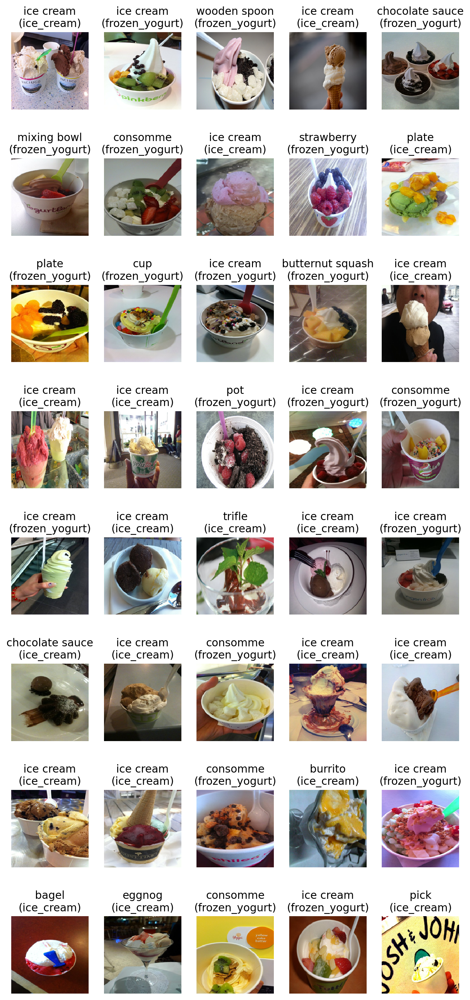

In [18]:
# make a plot: predicted (true)    
plt.figure(figsize=(9,20))
show_imgs(testXraw, nc=5, titles=titles)

- We will use the `Model` class
  - allows for more complex layer interactions than `Sequential`
  - first, connect layers one-by-one
    - instantiate the layer (with hyperparameters)
    - then pass the previous layer to it.
- Second, create the Model
  - specify the input and output layers
  - the network is everything in between
- Fix the weights of the layers of ResNet so they will not change during training

In [19]:
# Add global average pooling and custom classifier
def build_toponly(num_classes):
    # Load pre-trained ResNet50
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)

    # Freeze all layers (equivalent to layer.trainable = False)
    for param in model.parameters():
        param.requires_grad = False

    model_f = torch.nn.Sequential(*list(model.children())[:-1])  # Remove last layer
    base_model = torch.nn.Sequential(
        model_f,
        torch.nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
        torch.nn.Flatten(),  # Flatten to [batch_size, features]
        nn.Linear(2048, 32),  # Fully-connected layer (1x32)
        nn.ReLU(inplace=True),  # ReLU activation
        nn.Linear(32, num_classes),  # Final classifier (2 classes)
    )

    return base_model

- Setup validation set for monitoring

In [20]:
# generate a fixed validation set using 10% of the training set
_, validXim, vtrainXraw, _, vtrainY, validY = \
  model_selection.train_test_split(trainXim, trainXraw, trainY, 
  train_size=0.9, test_size=0.1, random_state=6487)
print('Training set: {}'.format(len(trainXraw)), trainXraw[0].size)
print(validXim.size())

Training set: 160 (224, 224)
torch.Size([16, 3, 224, 224])


- Setup the data augmentation generator

In [21]:
class GaussianNoise:
    """Add Gaussian noise with zero mean and specified variance"""
    def __init__(self, sigma2=0.1):
        self.sigma2 = sigma2
    
    def __call__(self, x):
        return x + torch.randn_like(x) * self.sigma2

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    # transforms.RandomAffine(
    #     degrees=0, 
    #     translate=(0.1, 0.1),  # width_shift_range and height_shift_range
    #     scale=(0.9, 1.1),      # zoom_range
    #     shear=0.1              # shear_range
    # ),
    transforms.ToTensor(),
    # GaussianNoise(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

class MyDataset(torch.utils.data.Dataset):
    def __init__(self, data, targets, transform):
        self.data = data
        self.targets = targets
        self.transform = transform
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        x = self.data[idx]
        x = self.transform(x)
        y = self.targets[idx]
        
        return x, y

# Create datasets with augmentation
trainset = MyDataset(vtrainXraw, torch.LongTensor(vtrainY), transform=train_transform)
validset = TensorDataset(validXim, torch.LongTensor(validY))

- Train the model
  - only the last layers that we added are updated

In [22]:
# Early stopping implementation
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0.0001, verbose=1):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_accuracy = 0.0
        self.early_stop = False
        self.verbose = verbose
        
    def __call__(self, current_accuracy):
        if current_accuracy - self.best_accuracy > self.min_delta:
            self.best_accuracy = current_accuracy
            self.counter = 0
        else:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        return self.early_stop

In [23]:
# Model Parameter Summarization
def summarize_layer_parameters(model):
    """
    Summarizes the number of parameters in each layer of a PyTorch model.
    """
    trainable_table = PrettyTable(["Module Name", "Parameters"])
    untrainable_table = PrettyTable(["Module Name", "Parameters"])
    total_params = {'train':0,'untrain':0}
    for name, parameter in model.named_parameters():
        if parameter.requires_grad:  # Only count trainable parameters
            params = parameter.numel()
            trainable_table.add_row([name, params])
            total_params['train'] += params
        else:  # Only count untrainable parameters
            params = parameter.numel()
            untrainable_table.add_row([name, params])
            total_params['untrain'] += params
        
    print(trainable_table)
    print(f"\nTotal Trainable Parameters: {total_params['train']}")
    if total_params['untrain'] > 0:
        print(untrainable_table)
    print(f"\nTotal Un-Trainable Parameters: {total_params['untrain']}")

In [24]:
# Model Evaluation
def evaluate_model(model, eval_loader, criterion=None):
    model.eval()
    eval_correct = 0
    eval_total = 0
    eval_loss = 0.0
    
    with torch.no_grad():
        for data, target in eval_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, predicted = torch.max(output.data, 1)
            eval_total += target.size(0)
            eval_correct += (predicted == target).sum().item()

            if criterion is not None:
                loss = criterion(output, target)
                eval_loss += loss.item()
    
    eval_accuracy = 100 * eval_correct / eval_total
    avg_eval_loss = eval_loss / len(eval_loader)

    return eval_accuracy if criterion is None else (eval_accuracy, avg_eval_loss)


# Model Training
def train_model(model, train_loader, valid_loader, criterion, optimizer, epochs=100, patience=5, batch_scheduler=None, epoch_scheduler=None):
    history = {
        'train_loss': [], 'val_loss': [],
        'train_accuracy': [], 'val_accuracy': [],
        'learning_rate':[]
    }
    early_stopping = EarlyStopping(patience=patience)
    assert batch_scheduler is None or epoch_scheduler is None
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.to(device), target.to(device)
            
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            
            loss.backward()
            optimizer.step()
            if batch_scheduler is not None:
                batch_scheduler.step()
                history['learning_rate'].append(optimizer.state_dict()['param_groups'][0]['lr'])
            
            train_loss += loss.item()
            _, predicted = torch.max(output.data, 1)
            train_total += target.size(0)
            train_correct += (predicted == target).sum().item()
        
        train_accuracy = 100 * train_correct / train_total
        avg_train_loss = train_loss / len(train_loader)
        
        # Validation phase
        val_accuracy, avg_val_loss = evaluate_model(model,valid_loader,criterion)
        
        # Store history
        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['train_accuracy'].append(train_accuracy / 100)
        history['val_accuracy'].append(val_accuracy / 100)
        
        train_msg = f'  Train Loss: {avg_train_loss:.6f}, Train Acc: {train_accuracy:.2f}%;'
        valid_msg = f'  Val Loss: {avg_val_loss:.6f}, Val Acc: {val_accuracy:.2f}%'
        
        print(f'Epoch {epoch+1}/{epochs}:', train_msg, valid_msg)

        # Check early stopping
        if patience > 0:
            early_stopping(val_accuracy)
            if early_stopping.early_stop:
                print("Early stopping triggered")
                break
            else:
                torch.save(model.state_dict(), 'best_model.pth')
        else:
            torch.save(model.state_dict(), 'best_model.pth')
        if epoch_scheduler is not None:
            if isinstance(epoch_scheduler, ReduceLROnPlateau):
                epoch_scheduler.step(avg_val_loss)
            else:
                epoch_scheduler.step()
            history['learning_rate'].append(optimizer.state_dict()['param_groups'][0]['lr'])

    # Load best model
    model.load_state_dict(torch.load('best_model.pth'))
    return history, model

In [25]:
# Initialize random seed
torch.manual_seed(4487)
random.seed(4487)
np.random.seed(4487)
if torch.cuda.is_available():
    torch.cuda.manual_seed(4487)
    torch.backends.cudnn.deterministic = True

# Create model instance
ftmodel = build_toponly(2)

# Print model architecture
# summarize_layer_parameters(ftmodel)

# Move model to device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ftmodel = ftmodel.to(device)
print(f"Using device: {device}")

# Create DataLoaders
batch_size = 50

train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(validset, batch_size=16, shuffle=False)

# Compile the network (equivalent in PyTorch)
criterion = nn.CrossEntropyLoss() 
train_param = filter(lambda p: p.requires_grad, ftmodel.parameters())
optimizer = optim.RMSprop(ftmodel.parameters(), lr=0.001)

# Train the model
history, ftmodel = train_model(ftmodel, train_loader, valid_loader, criterion, optimizer, epochs=50, patience=-1)

Using device: cuda
Epoch 1/50:   Train Loss: 2.448295, Train Acc: 50.00%;   Val Loss: 1.203903, Val Acc: 37.50%
Epoch 2/50:   Train Loss: 0.730163, Train Acc: 64.58%;   Val Loss: 0.580642, Val Acc: 62.50%
Epoch 3/50:   Train Loss: 0.673592, Train Acc: 55.56%;   Val Loss: 0.571283, Val Acc: 81.25%
Epoch 4/50:   Train Loss: 0.541362, Train Acc: 85.42%;   Val Loss: 0.544886, Val Acc: 81.25%
Epoch 5/50:   Train Loss: 0.550259, Train Acc: 68.75%;   Val Loss: 0.504507, Val Acc: 75.00%
Epoch 6/50:   Train Loss: 0.471064, Train Acc: 86.81%;   Val Loss: 0.544714, Val Acc: 87.50%
Epoch 7/50:   Train Loss: 0.469768, Train Acc: 81.94%;   Val Loss: 0.484918, Val Acc: 81.25%
Epoch 8/50:   Train Loss: 0.442836, Train Acc: 85.42%;   Val Loss: 0.629478, Val Acc: 81.25%
Epoch 9/50:   Train Loss: 0.454876, Train Acc: 79.86%;   Val Loss: 0.442438, Val Acc: 75.00%
Epoch 10/50:   Train Loss: 0.508065, Train Acc: 75.00%;   Val Loss: 0.434009, Val Acc: 68.75%
Epoch 11/50:   Train Loss: 0.371479, Train Acc: 90

- Training/validation curves

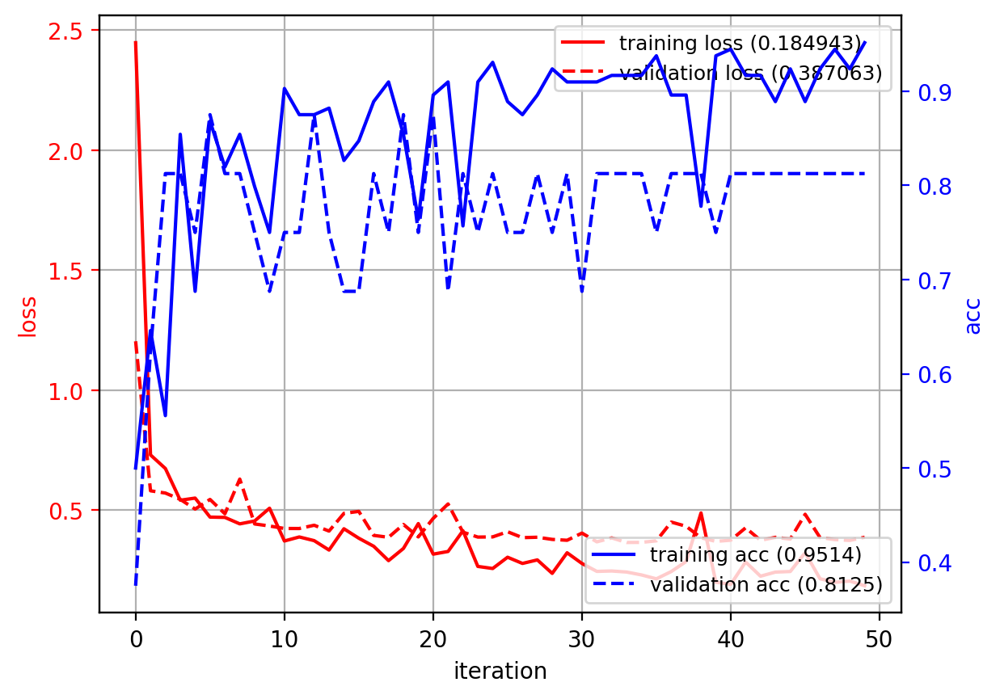

In [26]:
# Plot the training history
plot_history(history)

- Compute test accuracy

In [27]:
ftmodel.eval()
predYscore = ftmodel(testXim.to(device))
predY = torch.argmax(predYscore,dim=-1).cpu().numpy()
acc = metrics.accuracy_score(testY, predY)
print("test accuracy:", acc)

test accuracy: 0.925


- Visualize the predictions

In [28]:
# get the class labels
predYcl = le.inverse_transform(predY)
# make titles
titles = []
for i in range(len(predYcl)):
    titles.append(predYcl[i] + "\n(" + testYcl[i] + ")")

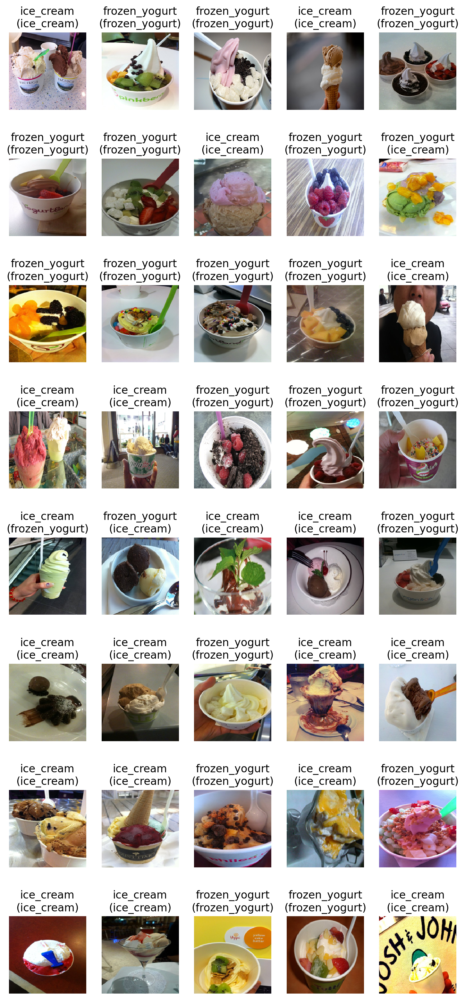

In [29]:
# make a plot: predicted (true)    
plt.figure(figsize=(9,20))
show_imgs(testXraw, nc=5, titles=titles)

# Generalization: Using more features
- the last layers of ResNet are high-level semantic features, which could be complemented by low-level or mid-level features.
- extract features from multiple layers and concatenate them.
- However, you may still get similar accuracy when using more features

# Other tips
- If the dataset is too large to load into memory, can use `tf.keras.utils.image_dataset_from_directory` to build a dataset from directory.
  - will handle disk reading and caching of files.
- each pre-trained network has its own `preprocess_input` function.
  - this function can also be used as a layer if you want to embed preprocessing into the network.
  - the expected input (pixel range and image size) varies - check the documentation.
  

# Summary
- Network "tricks" to go deeper:
  - ReLU activations -  encourage sparse activations, reduce vanishing gradient problem.
  - Batch Normalization - reparameterizing the network to be more stable.
- Optimization "tricks":
  - SGD with decaying learning rate
    - analysis shows that noisy gradient actually helps to ignore the small local minima.
  - Adaptive learning rates: AdaGrad, RMSProp, Adam.


- Deep architectures:
  - advances of deep learning has been driven by the ImageNet competiton.
  - error rate decreases as the depth increases.
  - as depth increases, need to have a smart architecture design to make training more effective.
    - VGGnet - deep version of standard CNN
    - InceptionNet - auxiliary tasks
    - ResNet - residual learning, equivalent to an ensemble of models.
    - SENet - channel-wise attention
  - Vision Transformer & self-attention
    - more training data can trump the inductive bias in CNNs
    - (at the cost of computation and parameters)

- Transfer learning
  - feature extractors learned from ImageNet can be re-used for other tasks.
    - global pooled feataures for high-level tasks
    - mid-level and high-level feature maps for other tasks like localization and detection.    
  - fine-tune a pre-trained network on our own specific task.
    - use the pre-trained network as a "backbone" network.
  - Pre-trained models: https://keras.io/api/applications/